In [2]:
!pip install ultralytics
!pip install pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.2/949.2 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 59.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [3]:
from ultralytics import YOLO
import os
from google.colab import drive
import yaml
import cv2, yaml, os, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T
from ultralytics import YOLO
import os
import shutil

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# First, make sure Google Drive is mounted
drive.mount('/content/drive')
model = YOLO('yolov8n.pt')


# Define the base path with the correct folder name (notice the space after CV)
base_path = "/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/"  # Changed from "Facial Feature Extraction Dataset"

# Define paths for train, valid, and test sets
valid_path = os.path.join(base_path, "valid")
train_path = os.path.join(base_path, "train")
test_path = os.path.join(base_path, "test")
yaml_file = os.path.join(base_path, "data.yaml")

# Let's first verify the base path exists
if os.path.exists(base_path):
    print("Base path exists!")
    # Check if the train directory exists before listing files
    if os.path.exists(train_path):
        print("Files in train directory:", os.listdir(train_path))
    else:
        print(f"Error: The path '{train_path}' does not exist.")
else:
    print(f"Error: The base path '{base_path}' does not exist.")

# Let's also print the contents of the CV directory to verify what's actually there
print("\nContents of Facial Feature Extraction Dataset directory:")
print(os.listdir(base_path))

Mounted at /content/drive


100%|██████████| 6.25M/6.25M [00:00<00:00, 61.9MB/s]


Base path exists!
Files in train directory: ['images', 'labels', 'labels.cache']

Contents of Facial Feature Extraction Dataset directory:
['data.yaml', '.DS_Store', 'valid', 'train', 'test', 'faster_rcnn_facial.pth', 'facial_feature_extraction_part2.py', 'facial_feature_extraction_part3.py', 'Python Codes', 'models', 'best.pt']


In [5]:

with open("/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/data.yaml", 'r') as file:
    data_config = yaml.safe_load(file)

# Display the contents of the YAML file
print(data_config)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 5, 'names': ['eye', 'eyebrow', 'lip', 'mustache-beard', 'nose'], 'roboflow': {'workspace': 'kagna-technologies-ddmoj', 'project': 'extracting-facial-features', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/kagna-technologies-ddmoj/extracting-facial-features/dataset/1'}}


Data analysis is in process...



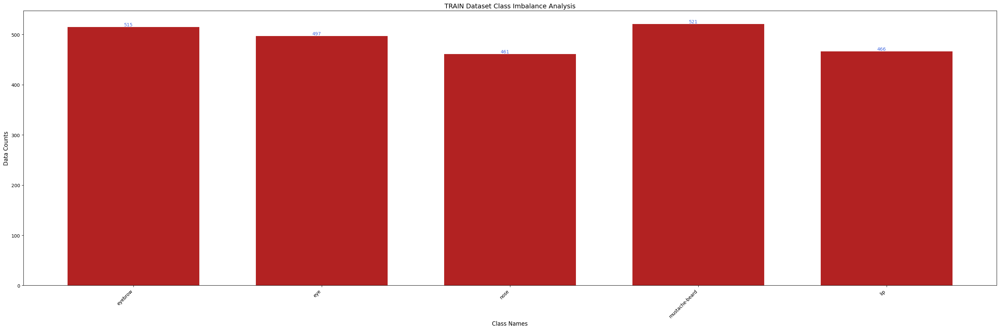

Data analysis is in process...



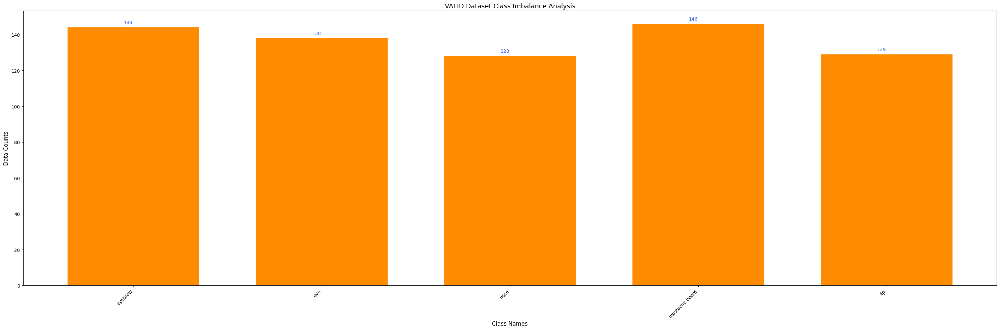

Data analysis is in process...



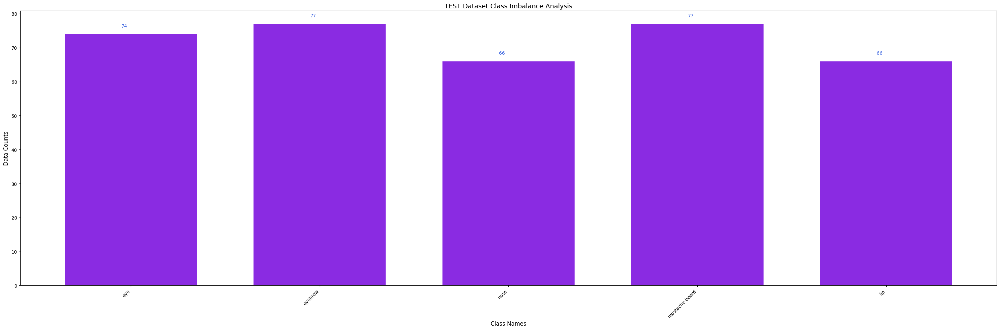

In [6]:

class Visualization:
    def __init__(self, root, data_types, n_ims, rows, cmap=None):
        self.root = root.rstrip('/')  # Remove trailing slash if present
        self.n_ims = n_ims
        self.rows = rows
        self.cmap = cmap
        self.data_types = data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        # Validate inputs
        if not os.path.exists(self.root):
            raise ValueError(f"Root directory '{self.root}' does not exist")
        if not os.path.exists(os.path.join(self.root, 'data.yaml')):
            raise ValueError(f"data.yaml not found in '{self.root}'")

        self.get_cls_names()
        self.get_bboxes()

    def get_cls_names(self):
        yaml_path = os.path.join(self.root, 'data.yaml')
        try:
            with open(yaml_path, 'r') as file:
                data = yaml.safe_load(file)
            # Extract class names
            class_names = data.get('names')
            if not class_names:
                raise ValueError("No 'names' field found in data.yaml")

            # Create a dictionary with index as key and class name as value
            self.class_dict = {index: name for index, name in enumerate(class_names)}
        except Exception as e:
            raise ValueError(f"Error reading class names from {yaml_path}: {str(e)}")

    def get_bboxes(self):
        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}

        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            images_dir = os.path.join(self.root, data_type, 'images')
            if not os.path.exists(images_dir):
                raise ValueError(f"Images directory not found: {images_dir}")

            im_paths = glob(os.path.join(images_dir, '*'))
            for idx, im_path in enumerate(im_paths):
                # Skip non-image files
                if not im_path.lower().endswith(('.png', '.jpg', '.jpeg')):
                    continue

                bboxes = []
                # Get corresponding label path
                lbl_path = im_path.replace('images', 'labels').rsplit('.', 1)[0] + '.txt'

                try:
                    with open(lbl_path, 'r') as f:
                        meta_data = f.readlines()

                    for data in meta_data:
                        parts = data.strip().split()[:5]
                        if len(parts) != 5:
                            print(f"Warning: Skipping invalid annotation in {lbl_path}")
                            continue

                        try:
                            cls_idx = int(parts[0])
                            cls_name = self.class_dict.get(cls_idx)
                            if cls_name is None:
                                print(f"Warning: Unknown class index {cls_idx} in {lbl_path}")
                                continue

                            bbox_coords = [float(x) for x in parts[1:]]
                            bboxes.append([cls_name] + bbox_coords)

                            all_analysis_datas[cls_name] = all_analysis_datas.get(cls_name, 0) + 1

                        except ValueError as e:
                            print(f"Warning: Invalid data format in {lbl_path}: {str(e)}")
                            continue

                except Exception as e:
                    print(f"Warning: Could not read label file {lbl_path}: {str(e)}")
                    continue

                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):
        try:
            plt.subplot(rows, cols, count)
            or_im = np.array(Image.open(im_path).convert("RGB"))
            height, width, _ = or_im.shape

            for bbox in bboxes:
                class_id, x_center, y_center, w, h = bbox

                # Ensure coordinates are within image bounds
                x_center = max(0, min(x_center, 1))
                y_center = max(0, min(y_center, 1))
                w = max(0, min(w, 1))
                h = max(0, min(h, 1))

                # Convert YOLO format to pixel values
                x_min = int((x_center - w / 2) * width)
                y_min = int((y_center - h / 2) * height)
                x_max = int((x_center + w / 2) * width)
                y_max = int((y_center + h / 2) * height)

                color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
                cv2.rectangle(img=or_im, pt1=(x_min, y_min), pt2=(x_max, y_max), color=color, thickness=3)

            plt.imshow(or_im)
            plt.axis("off")
            plt.title(f"There are {len(bboxes)} object(s) in the image.")

            return count + 1
        except Exception as e:
            print(f"Warning: Error plotting image {im_path}: {str(e)}")
            return count + 1

    def vis(self, save_name):
        print(f"{save_name.upper()} Data Visualization is in process...\n")
        if not self.cmap in ["rgb", "gray"]:
            raise ValueError("Please choose rgb or gray cmap")

        cmap = "viridis" if self.cmap == "rgb" else "gray"
        cols = self.n_ims // self.rows
        count = 1

        plt.figure(figsize=(25, 20))

        try:
            max_idx = len(self.vis_datas[save_name]) - 1
            if max_idx < 0:
                raise ValueError(f"No valid images found for {save_name}")

            indices = [random.randint(0, max_idx) for _ in range(self.n_ims)]

            for idx, index in enumerate(indices):
                if count == self.n_ims + 1:
                    break

                im_path = self.im_paths[save_name][index]
                bboxes = self.vis_datas[save_name][index]
                count = self.plot(self.rows, cols, count, im_path=im_path, bboxes=bboxes)

            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error visualizing {save_name} dataset: {str(e)}")

    def data_analysis(self, save_name, color):
        print("Data analysis is in process...\n")

        try:
            width, text_width, text_height = 0.7, 0.05, 2
            cls_names = list(self.analysis_datas[save_name].keys())
            counts = list(self.analysis_datas[save_name].values())

            if not cls_names:
                raise ValueError(f"No data available for {save_name}")

            _, ax = plt.subplots(figsize=(30, 10))
            indices = np.arange(len(counts))

            ax.bar(indices, counts, width, color=color)
            ax.set_xlabel("Class Names", color="black", fontsize=12)
            ax.set_ylabel("Data Counts", color="black", fontsize=12)
            ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis", fontsize=14)

            ax.set_xticks(indices)
            ax.set_xticklabels(cls_names, rotation=45, ha='right')

            # Add value labels
            for i, v in enumerate(counts):
                ax.text(i - text_width, v + text_height, str(v), color="royalblue", fontsize=10)

            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error analyzing {save_name} dataset: {str(e)}")

    def visualization(self):
        for save_name in self.data_types:
            self.vis(save_name)

    def analysis(self):
        for save_name, color in zip(self.data_types, self.colors):
            self.data_analysis(save_name, color)

# Usage
base_path = "/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/"
vis = Visualization(root=base_path, data_types=["train", "valid", "test"], n_ims=20, rows=5, cmap="rgb")
vis.analysis()

TRAIN Data Visualization is in process...



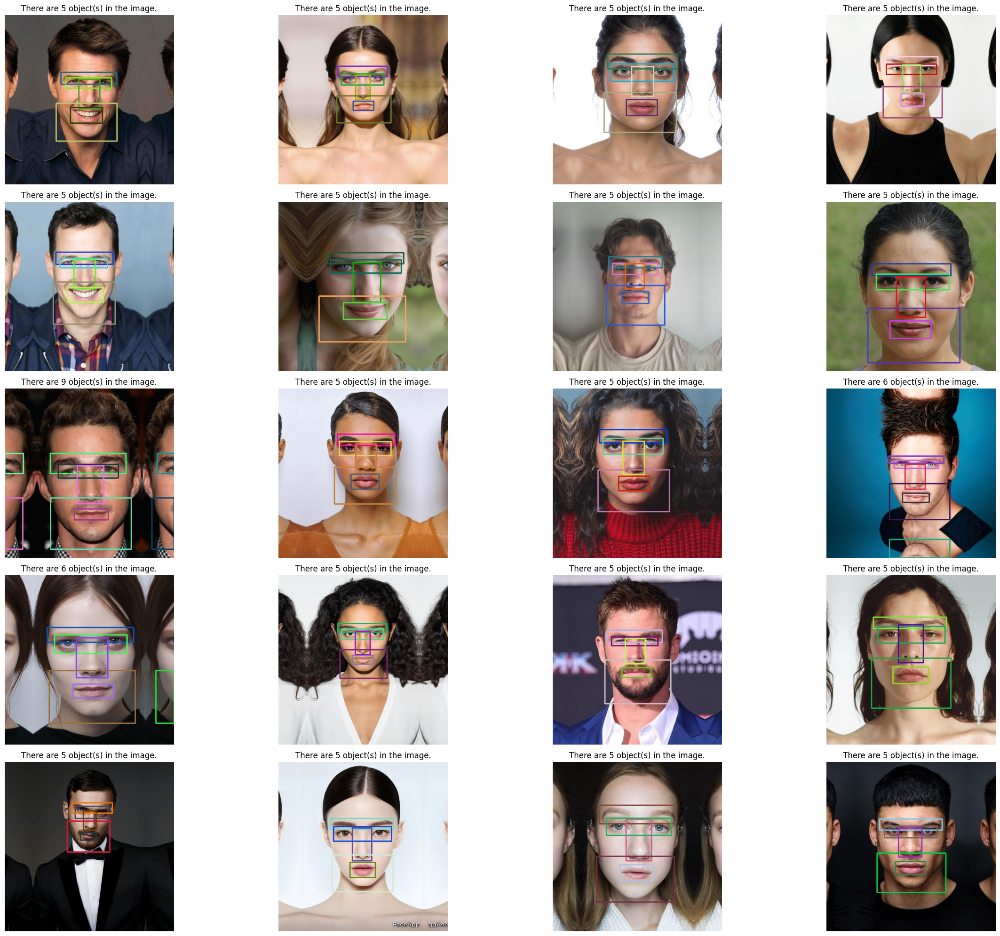

VALID Data Visualization is in process...



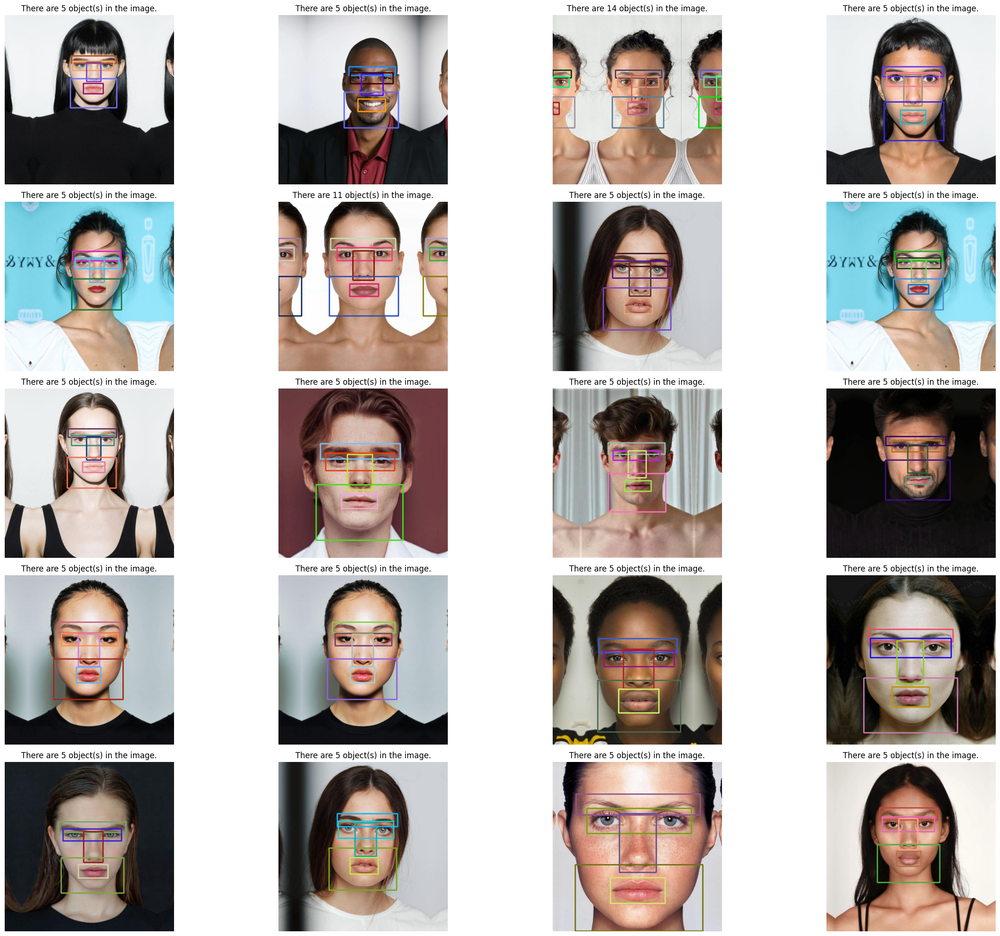

TEST Data Visualization is in process...



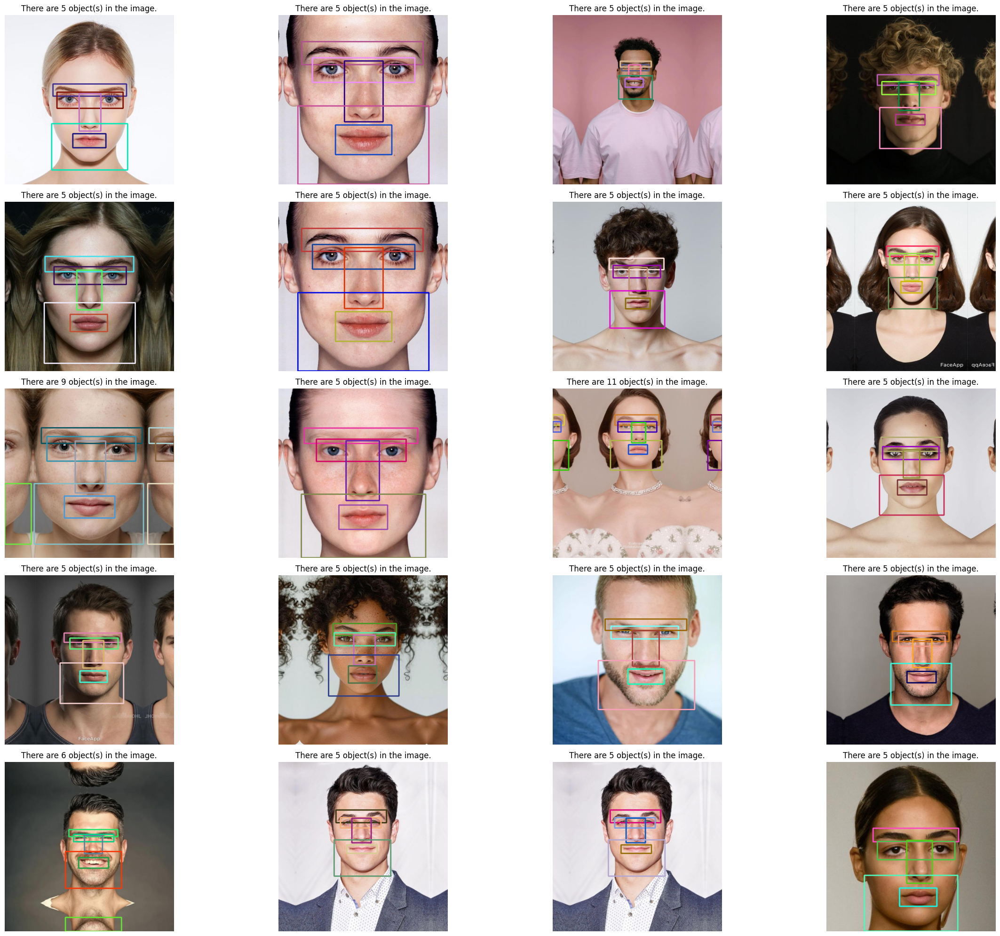

In [7]:
vis.visualization()

In [8]:

# Define the root path
root = "/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/"

# Load a pretrained YOLO model
model = YOLO('yolov8n.pt')  # load a pretrained model

# Train the model
train_results = model.train(
    data=f"{root}/data.yaml",
    epochs=10,
    imgsz=480,
    device=0,
    batch=16,
    workers=8,
    resume=False,
    pretrained=True,
    optimizer="auto",
    verbose=True,
    project="/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models"  # Save to Google Drive
)


# The models are typically saved in this location after training
default_best_model_path = os.path.join("runs", "detect", "train", "weights", "best.pt")
default_last_model_path = os.path.join("runs", "detect", "train", "weights", "last.pt")

# Define where to save in Google Drive
drive_best_path = "/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/best.pt"
drive_last_path = "/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/last.pt"



Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset//data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

100%|██████████| 755k/755k [00:00<00:00, 11.8MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 52.3MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/train/labels.cache... 457 images, 0 backgrounds, 0 corrupt: 100%|██████████| 457/457 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/valid/labels.cache... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 2 dataloader workers
Logging results to /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.19G      1.576      2.838      1.511         45        480: 100%|██████████| 29/29 [00:47<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        126        685     0.0131      0.732      0.661      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.46G     0.9783       1.02      1.087         45        480: 100%|██████████| 29/29 [00:07<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]

                   all        126        685          1       0.33      0.917      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.46G     0.8971     0.8286       1.03         45        480: 100%|██████████| 29/29 [00:08<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]

                   all        126        685      0.934        0.9       0.98       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.46G      0.854     0.7724          1         45        480: 100%|██████████| 29/29 [00:06<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.51it/s]

                   all        126        685      0.951      0.962      0.987       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.46G     0.8181     0.7103     0.9799         45        480: 100%|██████████| 29/29 [00:06<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        126        685      0.968      0.974      0.988      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.46G     0.7707     0.6628     0.9599         45        480: 100%|██████████| 29/29 [00:07<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]

                   all        126        685      0.972      0.982      0.986      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.46G     0.7588     0.6419     0.9568         45        480: 100%|██████████| 29/29 [00:06<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        126        685      0.962      0.991      0.991      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.46G     0.7454     0.6163     0.9372         51        480: 100%|██████████| 29/29 [00:06<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        126        685       0.98      0.983      0.989      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.46G     0.7133     0.5943     0.9341         51        480: 100%|██████████| 29/29 [00:08<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]

                   all        126        685      0.981      0.985      0.992      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.46G     0.7003     0.5806     0.9278         46        480: 100%|██████████| 29/29 [00:07<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        126        685      0.986      0.978      0.994      0.806



10 epochs completed in 0.040 hours.
Optimizer stripped from /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2/weights/best.pt, 6.2MB

Validating /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]


                   all        126        685      0.986      0.978      0.994      0.806
                   eye        126        138       0.99      0.986      0.995      0.797
               eyebrow        126        144      0.962      0.965       0.99      0.715
                   lip        126        129          1      0.988      0.995      0.833
        mustache-beard        126        146      0.979      0.968      0.993      0.827
                  nose        126        128      0.999      0.984      0.995      0.859
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train2


In [9]:
# Check if the model files exist and copy them
if os.path.exists(default_best_model_path):
    print(f"Copying best model from {default_best_model_path} to {drive_best_path}")
    shutil.copy(default_best_model_path, drive_best_path)
    print("Best model saved successfully!")
else:
    print(f"Warning: Could not find best model at {default_best_model_path}")

if os.path.exists(default_last_model_path):
    print(f"Copying last model from {default_last_model_path} to {drive_last_path}")
    shutil.copy(default_last_model_path, drive_last_path)
    print("Last model saved successfully!")
else:
    print(f"Warning: Could not find last model at {default_last_model_path}")

# List files in the weights directory to see what's available
weights_dir = os.path.join("runs", "detect", "train", "weights")
if os.path.exists(weights_dir):
    print(f"\nFiles in {weights_dir}:")
    for f in os.listdir(weights_dir):
        print(f"- {f}")
# Also check in the custom project location
custom_best_model_path = os.path.join("/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models", "train", "weights", "best.pt")
custom_last_model_path = os.path.join("/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models", "train", "weights", "last.pt")

if os.path.exists(custom_best_model_path):
    print(f"Found best model at custom location: {custom_best_model_path}")
    shutil.copy(custom_best_model_path, drive_best_path)
    print("Best model saved successfully!")


Found best model at custom location: /content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/weights/best.pt
Best model saved successfully!


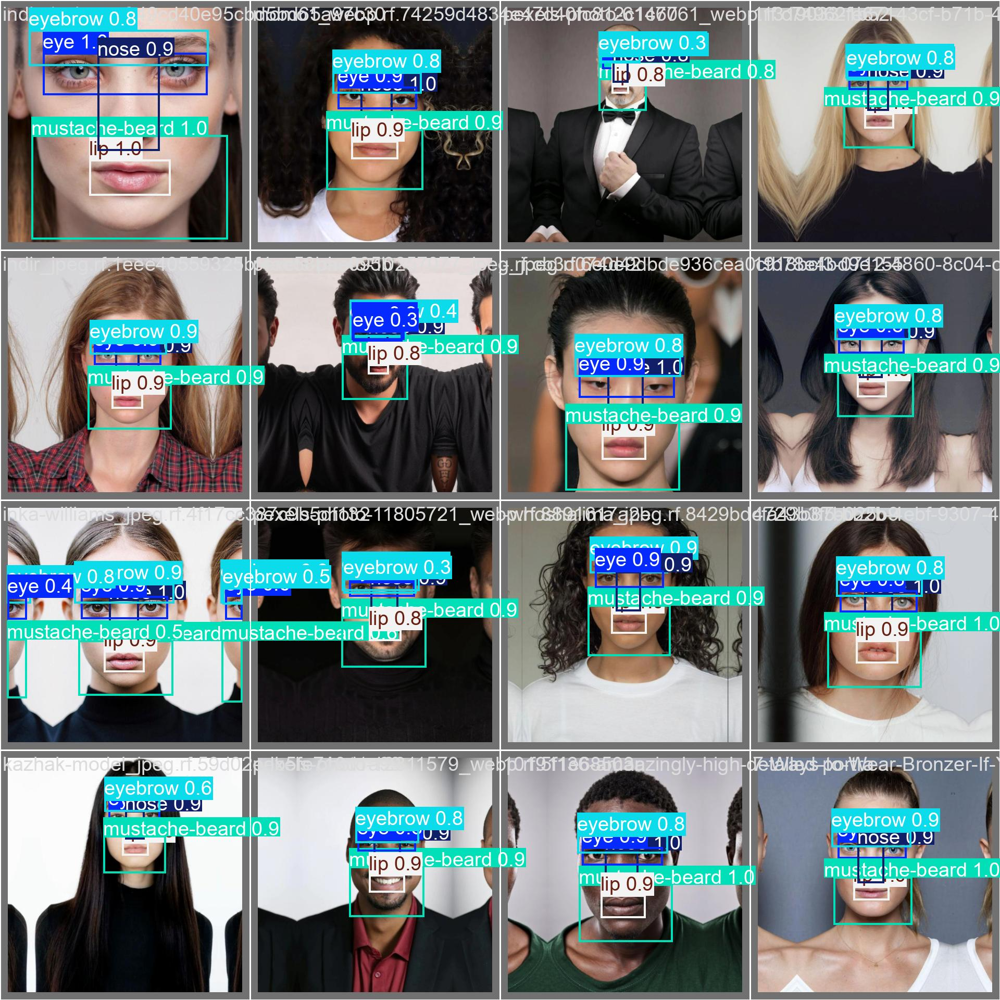

In [10]:
#Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/confusion_matrix.png")
#Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/results.png")
#Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/P_curve.png")
#Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/PR_curve.png")
Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/val_batch0_pred.jpg")
#Image.open(f"/content/drive/My Drive/ColabNotebooks/Facial Feature Extraction Dataset/models/train/val_batch1_pred.jpg")

In [11]:
#inference_results = model(f"{root}/test/images", device = 0)

In [12]:
#def inference_vis(res, n_ims, rows):
#    cols = n_ims // rows
#    plt.figure(figsize = (20, 10))
#    for idx, r in enumerate(res):
#        if idx == n_ims: break
#        plt.subplot(rows, cols, idx + 1)
#        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
#        if idx == n_ims: break
#        for i in r:
#            for bbox in i.boxes:
#                box = bbox.xyxy[0]
#                x1, y1, x2, y2 = box
#                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
#                color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
#                cv2.rectangle(or_im_rgb, coord1, coord2, color=color, thickness=2)
#        plt.imshow(or_im_rgb)
#        plt.title(f"Image#{idx + 1}\n{len(r)} object(s) are detected!")
#        plt.axis("off")
#inference_vis(res = inference_results, n_ims = 15, rows = 3)